# **Jigsaw 🧩 Puzzle 🧩 Evaluation and Assembly**
This notebook implements the complete preprocessing pipeline required for Milestone 2 of the course project.


## **1. Setup: Import Libraries & Constants**
In this section, we import all necessary libraries, mount point, and define the configuration constants.


In [37]:
from google.colab import drive
import os
drive.mount("/content/drive", force_remount=True)


Mounted at /content/drive


In [38]:
import os
import cv2
import numpy as np
import itertools
import pandas as pd

# ===== CONFIG =====
OUTPUT_ROOT = "/content/drive/MyDrive/Gravity Falls/output"
PUZZLE_TYPE = "puzzle_2x2"
BAND_WIDTH  = 5

IMAGE_IDS = list(range(30))  #Number of images

# Fill this with the correct permutation for each image id.
# Example:
# REFERENCE = {
#   0: (2,0,3,1),
#   1: (1,3,0,2),
#   ...
# }
REFERENCE = {
    0: (1,0,3,2),
    1: (2,0,1,3),
    2: (2,1,3,0),
    3: (3,1,2,0),
    4: (1,0,3,2),
    5: (3,1,0,2),
    6: (3,2,0,1),
    7: (0,2,1,3),
    8: (2,3,0,1),
    9: (0,3,2,1),
    10: (3,1,0,2),
    11: (0,2,1,3),
    12: (0,2,3,1),
    13: (1,2,0,3),
    14: (3,1,2,0),
    15: (0,2,1,3),
    16: (2,0,3,1),
    17: (0,1,3,2),
    18: (3,2,0,1),
    19: (2,3,0,1),
    20: (3,0,1,2),
    21: (2,0,1,3),
    22: (3,1,0,2),
    23: (0,1,3,2),
    24: (0,3,2,1),
    25: (2,1,3,0),
    26: (3,1,2,0),
    27: (3,0,1,2),
    28: (1,3,0,2),
    29: (2,0,1,3)
}


## **2. I/O Helpers: Functions to Load and Prepare Puzzle Tiles**


In [39]:
def get_versions_for_image(image_id):
    base = os.path.join(OUTPUT_ROOT, PUZZLE_TYPE, str(image_id))
    if not os.path.isdir(base):
        return []
    return sorted(d for d in os.listdir(base) if os.path.isdir(os.path.join(base, d)))

def load_tiles_for_version(image_id, version):
    folder = os.path.join(OUTPUT_ROOT, PUZZLE_TYPE, str(image_id), version)
    if not os.path.isdir(folder):
        raise FileNotFoundError(folder)

    filenames = sorted(
        [f for f in os.listdir(folder) if f.lower().endswith(".png")],
        key=lambda name: int(os.path.splitext(name)[0])
    )

    tiles = []
    for fname in filenames:
        path = os.path.join(folder, fname)

        if version == "color":
            img = cv2.imread(path, cv2.IMREAD_COLOR)
        else:
            img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

        if img is None:
            raise FileNotFoundError(path)
        tiles.append(img)

    if len(tiles) != 4:
        raise ValueError(f"Expected 4 tiles in {folder}, found {len(tiles)}")

    return tiles


## **3. Seam Scoring: Helper Functions for Edge Extraction and MSE Calculation**


In [40]:
def to_gray01(img_u8):
    return img_u8.astype(np.float32) / 255.0

def extract_edge_bands(gray01, band_width=BAND_WIDTH):
    h, w = gray01.shape
    bw = min(band_width, h // 2, w // 2)
    return {
        "top": gray01[:bw, :],
        "bottom": gray01[h-bw:, :],
        "left": gray01[:, :bw],
        "right": gray01[:, w-bw:],
    }

def mse(a, b):
    h = min(a.shape[0], b.shape[0])
    w = min(a.shape[1], b.shape[1])
    a = a[:h, :w]
    b = b[:h, :w]
    return float(np.mean((a - b) ** 2))


## **4. Puzzle Assembly: Solving for Best Permutation Using MSE**


In [41]:
def solve_2x2_single_version(image_id, version):
    """
    Returns best_perm for this (image_id, version) using seam MSE.
    """
    tiles = load_tiles_for_version(image_id, version)
    gray_tiles = [to_gray01(t) for t in tiles]
    bands = [extract_edge_bands(g) for g in gray_tiles]

    N = 4
    cost_right = np.full((N, N), np.inf, dtype=np.float64)
    cost_bottom = np.full((N, N), np.inf, dtype=np.float64)

    for i in range(N):
        for j in range(N):
            if i == j:
                continue
            cost_right[i, j] = mse(bands[i]["right"], bands[j]["left"])
            cost_bottom[i, j] = mse(bands[i]["bottom"], bands[j]["top"])

    best_perm = None
    best_score = np.inf
    for perm in itertools.permutations(range(N), N):
        A, B, C, D = perm
        score = (
            cost_right[A, B] + cost_right[C, D] +
            cost_bottom[A, C] + cost_bottom[B, D]
        )
        if score < best_score:
            best_score = score
            best_perm = perm

    return best_perm, best_score


## **5. Evaluation: Calculating Accuracy and Displaying Results**


In [42]:
def evaluate_all_versions(image_ids):
    """
    Evaluates each version independently.
    Prints per-version accuracy across images that have reference.
    """
    # Collect all versions seen across the dataset
    all_versions = set()
    for iid in image_ids:
        for v in get_versions_for_image(iid):
            all_versions.add(v)
    all_versions = sorted(all_versions)

    if not all_versions:
        raise ValueError("No versions found. Check OUTPUT_ROOT / PUZZLE_TYPE path.")

    # Only evaluate images that have reference
    eval_ids = [iid for iid in image_ids if iid in REFERENCE]
    if not eval_ids:
        raise ValueError("REFERENCE is empty. Fill it with correct perms first.")

    rows = []
    for v in all_versions:
        correct = 0
        total = 0

        for iid in eval_ids:
            try:
                pred_perm, pred_score = solve_2x2_single_version(iid, v)
            except Exception:
                continue

            total += 1
            if tuple(pred_perm) == tuple(REFERENCE[iid]):
                correct += 1

        acc = (correct / total) if total > 0 else np.nan
        rows.append({
            "version": v,
            "tested": total,
            "correct": correct,
            "accuracy": acc,
        })

    df = pd.DataFrame(rows).sort_values(["accuracy", "tested"], ascending=[False, False])
    display(df)
    return df


## **6. Run: Generate Results in a Table**


In [43]:
df = evaluate_all_versions(IMAGE_IDS)


,version,tested,correct,accuracy
7,sharpened_low-pass,30,20,0.666667
6,sharpened,30,19,0.633333
9,sobel_low-pass,30,11,0.366667
5,log_low-pass,30,6,0.200000
8,sobel,30,6,0.200000
1,canny_low-pass,30,2,0.066667
3,highpass,30,1,0.033333
0,canny,30,0,0.000000
4,log,30,0,0.000000
2,color,0,0,NaN


## **7. Sharpened-Only Solver (ZNCC + Shift) — Visualize Predicted Assembly**
This section solves each 2×2 puzzle using the **sharpened** version only (ZNCC + shift seam cost).  
Then it **visualizes** the predicted assembly in:
- **Sharpened** (grayscale) for seam clarity
- **Color** for human-friendly viewing


In [44]:
import os
import cv2
import numpy as np
import itertools
import matplotlib.pyplot as plt

# =========================
# CONFIGURATION
# =========================
OUTPUT_ROOT = "/content/drive/MyDrive/Gravity Falls/output"
PUZZLE_TYPE = "puzzle_2x2"
BAND_WIDTH  = 5
IMAGE_IDS   = list(range(30))  # 0..29


## **8. I/O: Load Tiles for a Given Version**
Loads exactly 4 tiles from the corresponding output folder for a given preprocessing version.


In [45]:
def load_tiles_for_version(image_id, version, expected_n=4):
    """
    Loads tiles for one image_id and preprocessing version.

    Folder structure:
      OUTPUT_ROOT / PUZZLE_TYPE / image_id / version / {0..3}.png

    - If version == "color": loads BGR (3-channel)
    - Else: loads grayscale (1-channel)
    """
    folder = os.path.join(OUTPUT_ROOT, PUZZLE_TYPE, str(image_id), version)
    if not os.path.isdir(folder):
        raise FileNotFoundError(folder)

    filenames = sorted(
        [f for f in os.listdir(folder) if f.lower().endswith(".png")],
        key=lambda name: int(os.path.splitext(name)[0])
    )

    tiles = []
    for fname in filenames:
        path = os.path.join(folder, fname)

        if version == "color":
            img = cv2.imread(path, cv2.IMREAD_COLOR)      # BGR
        else:
            img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  # gray

        if img is None:
            raise FileNotFoundError(path)

        tiles.append(img)

    if len(tiles) != expected_n:
        raise ValueError(f"Expected {expected_n} tiles in {folder}, found {len(tiles)}")

    return tiles


## **9. Edge Bands + ZNCC Seam Cost**
We extract narrow edge bands and compute seam similarity using **ZNCC** (robust to brightness shifts).  
We also allow small shifts to handle slight misalignment across tile boundaries.


In [46]:
def to_gray01(img_u8):
    """
    Converts uint8 grayscale image to float32 [0..1].
    """
    return img_u8.astype(np.float32) / 255.0


def extract_edge_bands(gray01, band_width=BAND_WIDTH):
    """
    Extracts narrow edge bands from the 4 sides of a grayscale image.
    """
    h, w = gray01.shape
    bw = min(band_width, h // 2, w // 2)
    return {
        "top":    gray01[:bw, :],
        "bottom": gray01[h-bw:, :],
        "left":   gray01[:, :bw],
        "right":  gray01[:, w-bw:],
    }


def zncc(a, b, eps=1e-8):
    """
    Zero-mean normalized cross-correlation (ZNCC).
    Higher correlation => better match.
    """
    a = a.astype(np.float32)
    b = b.astype(np.float32)

    a = a - a.mean()
    b = b - b.mean()

    denom = (a.std() * b.std()) + eps
    return float((a * b).mean() / denom)


def seam_cost_zncc(A, B, shift_axis, max_shift=6):
    """
    Computes a seam cost between edge bands A and B using ZNCC,
    searching over small shifts to tolerate minor misalignment.

    shift_axis:
      0 -> shift along rows
      1 -> shift along cols

    Returns:
      cost = 1 - best_ZNCC  (lower is better)
    """
    best_corr = -1e9

    for s in range(-max_shift, max_shift + 1):
        if shift_axis == 0:
            # shift along rows
            if s >= 0:
                A_crop = A[s:, :]
                B_crop = B[:A_crop.shape[0], :]
            else:
                A_crop = A[:s, :]
                B_crop = B[-s:, :]
        else:
            # shift along cols
            if s >= 0:
                A_crop = A[:, s:]
                B_crop = B[:, :A_crop.shape[1]]
            else:
                A_crop = A[:, :s]
                B_crop = B[:, -s:]

        # Skip invalid crops
        if A_crop.size == 0 or B_crop.size == 0:
            continue
        if A_crop.shape[0] < 2 or A_crop.shape[1] < 2:
            continue

        corr = zncc(A_crop, B_crop)
        if corr > best_corr:
            best_corr = corr

    return 1.0 - best_corr


## **10. Solver: Sharpened-Only ZNCC + Shift**
This solver uses only the **sharpened** tiles to compute seam costs and find the best 2×2 arrangement.


In [47]:
def solve_2x2_sharpened_only_zncc(image_id, max_shift=6):
    """
    Solves a 2x2 puzzle using ONLY the 'sharpened' version tiles.
    Uses ZNCC seam cost with small shifts for robustness.

    Returns:
      best_perm  (A,B,C,D)
      best_score (lower is better)
    """
    version = "sharpened"
    tiles = load_tiles_for_version(image_id, version, expected_n=4)

    # Ensure grayscale float [0..1]
    gray = [to_gray01(t) for t in tiles]
    bands = [extract_edge_bands(g) for g in gray]

    N = 4
    cost_right  = np.full((N, N), np.inf, dtype=np.float64)
    cost_bottom = np.full((N, N), np.inf, dtype=np.float64)

    # Pairwise seam costs
    for i in range(N):
        for j in range(N):
            if i == j:
                continue
            # Right neighbor: compare right edge of i with left edge of j
            cost_right[i, j] = seam_cost_zncc(
                bands[i]["right"], bands[j]["left"],
                shift_axis=0, max_shift=max_shift
            )
            # Bottom neighbor: compare bottom edge of i with top edge of j
            cost_bottom[i, j] = seam_cost_zncc(
                bands[i]["bottom"], bands[j]["top"],
                shift_axis=1, max_shift=max_shift
            )

    # Brute-force best permutation
    best_perm  = None
    best_score = np.inf

    for perm in itertools.permutations(range(N), N):
        A, B, C, D = perm
        score = (
            cost_right[A, B] +
            cost_right[C, D] +
            cost_bottom[A, C] +
            cost_bottom[B, D]
        )
        if score < best_score:
            best_score = score
            best_perm  = perm

    return best_perm, best_score


## **11. Visualization: Assemble & Show Predicted Result**
We build the predicted 2×2 output and display:
- Predicted assembly in **sharpened**
- Predicted assembly in **color**


In [48]:
def assemble_2x2(tiles, perm):
    """
    Assembles a 2x2 image from a list of 4 tiles using a permutation (A,B,C,D).
    Works for grayscale (H,W) or color (H,W,3).
    """
    A, B, C, D = perm
    h, w = tiles[0].shape[:2]

    if tiles[0].ndim == 2:
        out = np.zeros((2*h, 2*w), dtype=np.uint8)
    else:
        out = np.zeros((2*h, 2*w, 3), dtype=np.uint8)

    out[0:h,   0:w]   = tiles[A]
    out[0:h,   w:2*w] = tiles[B]
    out[h:2*h, 0:w]   = tiles[C]
    out[h:2*h, w:2*w] = tiles[D]

    return out


def show_sharpened_prediction(image_id, max_shift=6):
    """
    Solves using sharpened tiles only, then visualizes the predicted assembly in:
      - sharpened (grayscale)
      - color (RGB) for visual inspection

    No ground-truth comparison is performed.
    """
    pred_perm, pred_score = solve_2x2_sharpened_only_zncc(image_id, max_shift=max_shift)

    # Load tiles for visualization
    tiles_sharp = load_tiles_for_version(image_id, "sharpened", expected_n=4)  # grayscale
    tiles_color = load_tiles_for_version(image_id, "color", expected_n=4)      # BGR

    pred_sharp = assemble_2x2(tiles_sharp, pred_perm)
    pred_color_bgr = assemble_2x2(tiles_color, pred_perm)
    pred_color_rgb = cv2.cvtColor(pred_color_bgr, cv2.COLOR_BGR2RGB)

    # Plot: tiles + predicted sharpened + predicted color
    plt.figure(figsize=(12, 4))

    for i, t in enumerate(tiles_sharp):
        plt.subplot(2, 5, i + 1)
        plt.imshow(t, cmap="gray")
        plt.axis("off")
        plt.title(f"Tile {i}", fontsize=8)

    plt.subplot(2, 5, 6)
    plt.imshow(pred_sharp, cmap="gray")
    plt.axis("off")
    plt.title(f"Pred (sharpened)\n{pred_perm}", fontsize=9)

    plt.subplot(2, 5, 7)
    plt.imshow(pred_color_rgb)
    plt.axis("off")
    plt.title("Pred (color)", fontsize=9)

    plt.suptitle(f"Image {image_id} — score={pred_score:.6f}", fontsize=11)
    plt.tight_layout()
    plt.show()

    return pred_perm, pred_score


## **12. Run: Show Predictions for All Images**
This loop runs the solver for each image and displays the predicted assembly.


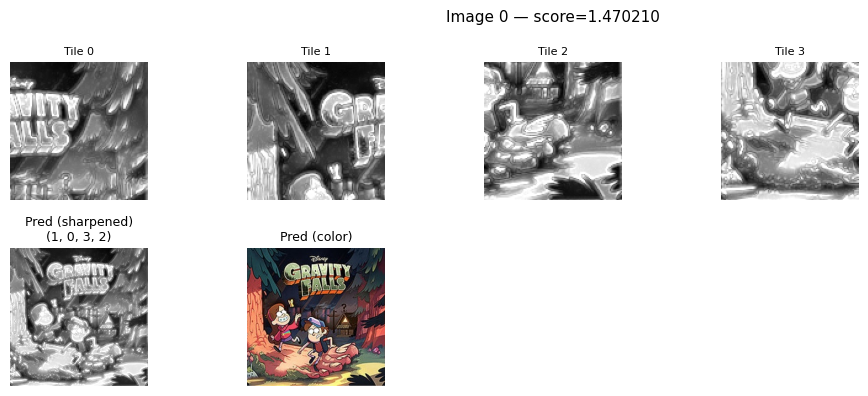

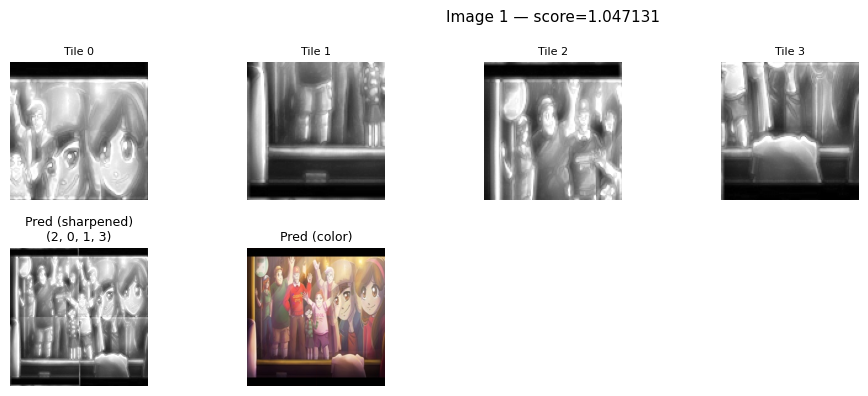

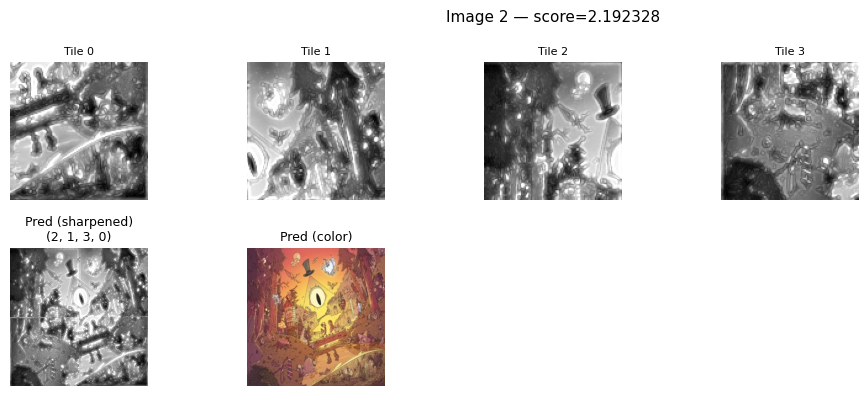

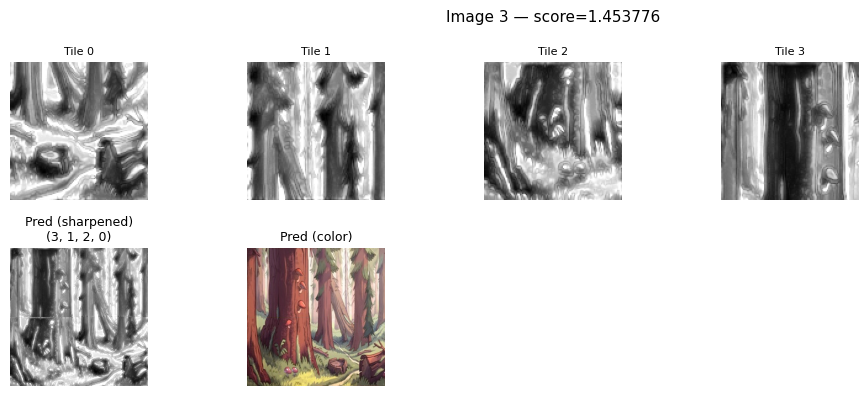

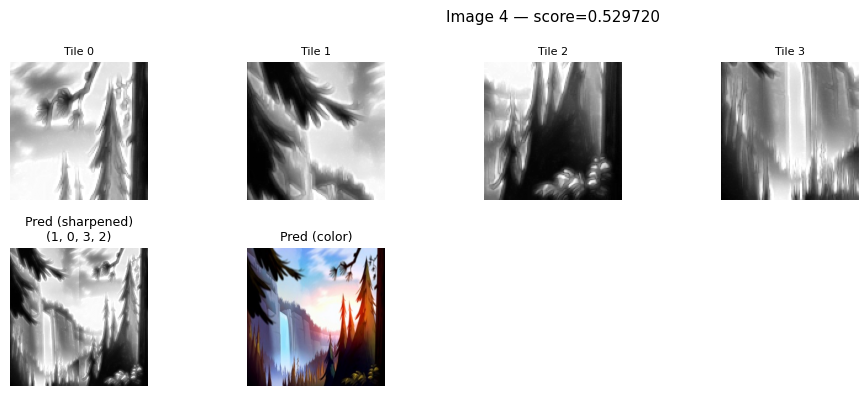

...

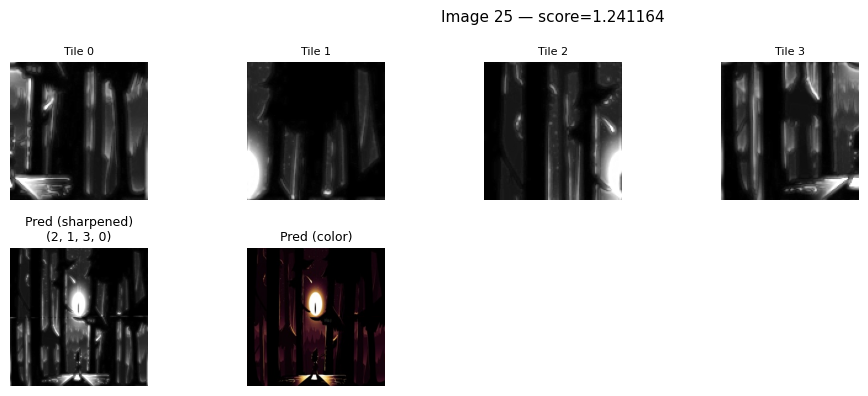

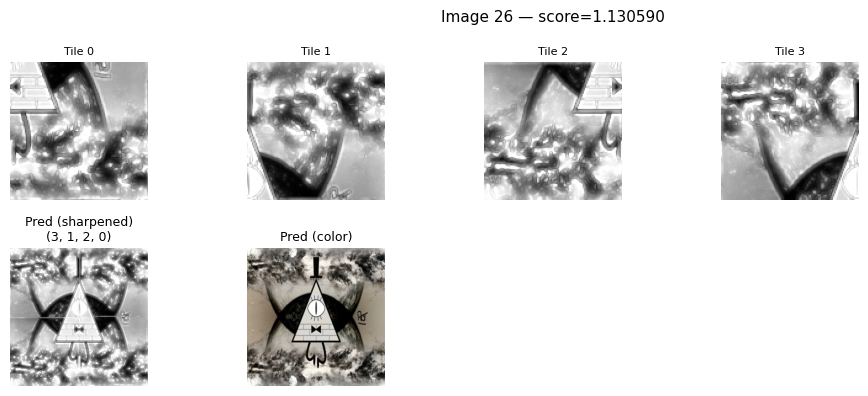

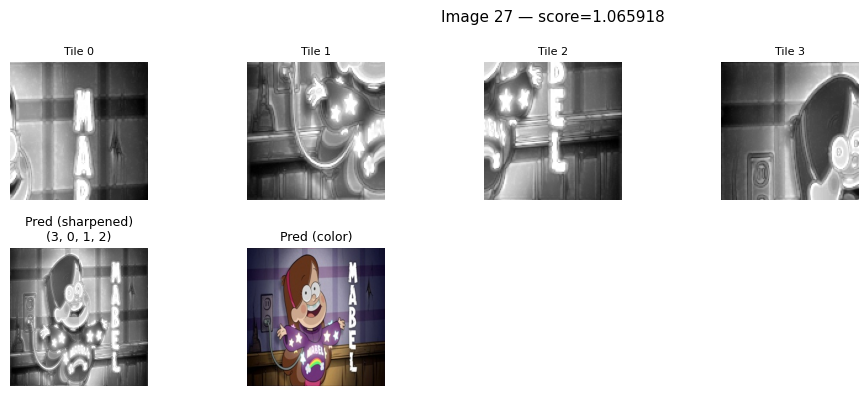

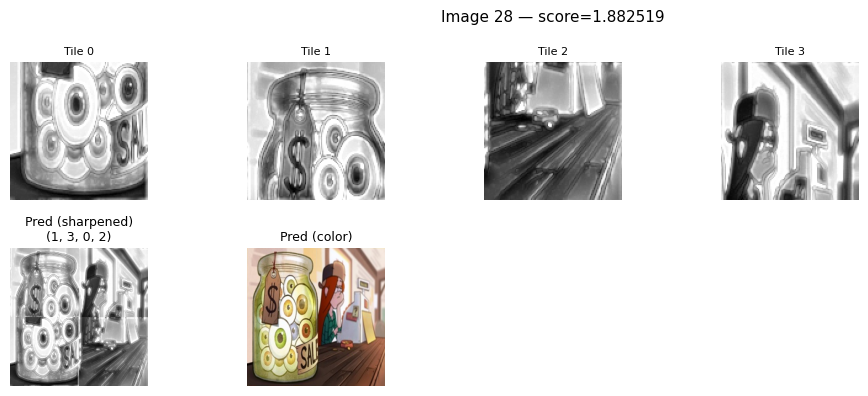

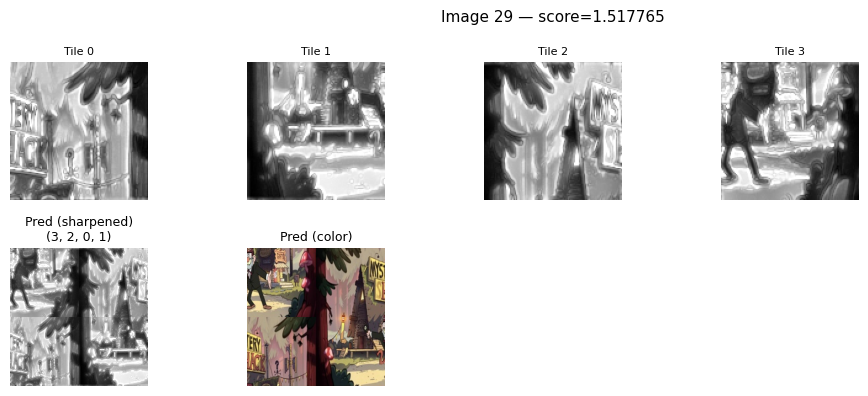

In [49]:
for iid in IMAGE_IDS:
    show_sharpened_prediction(iid, max_shift=6)


## **13. 4×4 Solver (ZNCC + Shift + Simulated Annealing) — Visualize Predicted Assembly**
This section solves each **4×4** puzzle using **ZNCC seam matching with small shifts**, then optimizes the full grid using **Simulated Annealing (SA)**.  
Finally, it visualizes the predicted assembly in:
- **Sharpened** (grayscale) for seam clarity  
- **Color** for visual inspection  


In [50]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# =========================
# CONFIGURATION
# =========================
OUTPUT_ROOT = "/content/drive/MyDrive/Gravity Falls/output"
PUZZLE_TYPE = "puzzle_4x4"
BAND_WIDTH  = 5


## **14. I/O: Load Tiles for a Given Version**
Loads the 16 tiles (0..15) for a given preprocessing version.


In [51]:
def load_tiles_for_version(image_id, version, expected_n=16):
    """
    Loads tiles for one image_id and preprocessing version.

    Folder structure:
      OUTPUT_ROOT / PUZZLE_TYPE / image_id / version / {0..15}.png

    - If version == "color": loads BGR (3-channel)
    - Else: loads grayscale (1-channel)
    """
    folder = os.path.join(OUTPUT_ROOT, PUZZLE_TYPE, str(image_id), version)
    if not os.path.isdir(folder):
        raise FileNotFoundError(folder)

    filenames = sorted(
        [f for f in os.listdir(folder) if f.lower().endswith(".png")],
        key=lambda name: int(os.path.splitext(name)[0])
    )

    tiles = []
    for fname in filenames:
        path = os.path.join(folder, fname)

        if version == "color":
            img = cv2.imread(path, cv2.IMREAD_COLOR)      # BGR
        else:
            img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  # gray

        if img is None:
            raise FileNotFoundError(path)

        tiles.append(img)

    if len(tiles) != expected_n:
        raise ValueError(f"Expected {expected_n} tiles in {folder}, found {len(tiles)}")

    return tiles


## **15. Edge Bands**
We convert tiles to float grayscale and extract narrow edge bands to compare seams.


In [52]:
def to_gray01(img_u8):
    """
    Converts uint8 grayscale image to float32 [0..1].
    """
    return img_u8.astype(np.float32) / 255.0


def extract_edge_bands(gray01, band_width=BAND_WIDTH):
    """
    Extracts narrow edge bands from the four sides of a grayscale image.
    """
    h, w = gray01.shape
    bw = min(band_width, h // 2, w // 2)
    return {
        "top":    gray01[:bw, :],
        "bottom": gray01[h-bw:, :],
        "left":   gray01[:, :bw],
        "right":  gray01[:, w-bw:],
    }


## **16. ZNCC + Shift Seam Cost**
We compute seam similarity using **ZNCC** and search over small shifts to handle minor misalignment.


In [53]:
def zncc(a, b, eps=1e-8):
    """
    Zero-mean normalized cross-correlation (ZNCC).
    Higher values indicate a better match.
    """
    a = a.astype(np.float32)
    b = b.astype(np.float32)

    a = a - a.mean()
    b = b - b.mean()

    denom = (a.std() * b.std()) + eps
    return float((a * b).mean() / denom)


def best_shift_zncc(A, B, shift_axis, max_shift):
    """
    Finds the best ZNCC score between A and B while allowing a small shift.

    shift_axis:
      0 -> shift along rows
      1 -> shift along columns
    """
    best_corr = -1e9

    for s in range(-max_shift, max_shift + 1):
        if shift_axis == 0:
            # shift along rows
            if s >= 0:
                A_crop = A[s:, :]
                B_crop = B[:A_crop.shape[0], :]
            else:
                A_crop = A[:s, :]
                B_crop = B[-s:, :]
        else:
            # shift along columns
            if s >= 0:
                A_crop = A[:, s:]
                B_crop = B[:, :A_crop.shape[1]]
            else:
                A_crop = A[:, :s]
                B_crop = B[:, -s:]

        if A_crop.size == 0 or B_crop.size == 0:
            continue
        if A_crop.shape[0] < 2 or A_crop.shape[1] < 2:
            continue

        corr = zncc(A_crop, B_crop)
        if corr > best_corr:
            best_corr = corr

    return best_corr


def seam_cost_zncc_flipped(A, B, seam_type, max_shift=6):
    """
    Converts ZNCC similarity into a cost:
      cost = 1 - best_ZNCC  (lower is better)

    seam_type:
      "RL": A is right edge band, B is left edge band
      "BT": A is bottom edge band, B is top edge band
    """
    if seam_type == "RL":
        B2 = np.fliplr(B)
        corr = best_shift_zncc(A, B2, shift_axis=0, max_shift=max_shift)
    elif seam_type == "BT":
        B2 = np.flipud(B)
        corr = best_shift_zncc(A, B2, shift_axis=1, max_shift=max_shift)
    else:
        raise ValueError('seam_type must be "RL" or "BT"')

    return 1.0 - corr


## **17. Cost Matrices for the Whole Puzzle**
We build two cost matrices:
- `C_R[i, j]`: cost if tile `j` is to the **right** of tile `i`
- `C_B[i, j]`: cost if tile `j` is **below** tile `i`


In [54]:
def build_cost_matrices(image_id, versions=("sharpened",), max_shift=6):
    """
    Builds right-neighbor and bottom-neighbor seam cost matrices.
    If multiple versions are provided, their costs are summed (fusion).
    """
    N = 16
    C_R_sum = np.zeros((N, N), dtype=np.float64)
    C_B_sum = np.zeros((N, N), dtype=np.float64)

    for v in versions:
        tiles = load_tiles_for_version(image_id, v, expected_n=16)

        # Ensure grayscale float [0..1]
        gray_tiles_u8 = []
        for t in tiles:
            if t.ndim == 3:  # if accidentally loaded color
                t = cv2.cvtColor(t, cv2.COLOR_BGR2GRAY)
            gray_tiles_u8.append(t)

        gray_tiles = [to_gray01(t) for t in gray_tiles_u8]
        bands = [extract_edge_bands(g) for g in gray_tiles]

        C_R = np.full((N, N), np.inf, dtype=np.float64)
        C_B = np.full((N, N), np.inf, dtype=np.float64)

        for i in range(N):
            for j in range(N):
                if i == j:
                    continue
                C_R[i, j] = seam_cost_zncc_flipped(
                    bands[i]["right"], bands[j]["left"], "RL", max_shift=max_shift
                )
                C_B[i, j] = seam_cost_zncc_flipped(
                    bands[i]["bottom"], bands[j]["top"], "BT", max_shift=max_shift
                )

        np.fill_diagonal(C_R, 0.0)
        np.fill_diagonal(C_B, 0.0)

        C_R_sum += C_R
        C_B_sum += C_B

    return C_R_sum, C_B_sum


## **18. Global Seam Energy**
Defines the total seam cost for a full 4×4 grid arrangement.


In [55]:
def seam_energy(grid, C_R, C_B):
    """
    Computes total seam energy for a 4x4 grid.
    Lower energy indicates better global consistency.
    """
    e = 0.0

    # Horizontal seams: 4 rows × 3 seams
    for r in range(4):
        for c in range(3):
            a = grid[r, c]
            b = grid[r, c + 1]
            e += C_R[a, b]

    # Vertical seams: 3 seams × 4 cols
    for r in range(3):
        for c in range(4):
            a = grid[r, c]
            b = grid[r + 1, c]
            e += C_B[a, b]

    return e


## **19. Greedy Initialization**
Creates a reasonable starting grid before simulated annealing.


In [56]:
def init_grid_greedy(C_R, C_B, seed=0):
    """
    Greedy construction of a 4x4 grid.
    At each position, choose the remaining tile that adds the smallest local seam cost.
    """
    rng = np.random.default_rng(seed)
    remaining = list(range(16))
    rng.shuffle(remaining)

    grid = np.full((4, 4), -1, dtype=int)
    used = set()

    for pos in range(16):
        r, c = divmod(pos, 4)

        best_t = None
        best_add = 1e18

        for t in remaining:
            if t in used:
                continue

            add = 0.0
            if c > 0:
                add += C_R[grid[r, c - 1], t]
            if r > 0:
                add += C_B[grid[r - 1, c], t]

            if add < best_add:
                best_add = add
                best_t = t

        grid[r, c] = best_t
        used.add(best_t)

    return grid


## **20. Simulated Annealing Optimizer**
Refines the grid by swapping tiles and probabilistically accepting improvements.


In [57]:
def solve_4x4_sa(C_R, C_B, steps=40000, T0=0.20, Tend=0.01, restarts=6, seed=123):
    """
    Simulated annealing over 4x4 grid permutations.
    Uses multiple restarts to reduce sensitivity to initialization.
    """
    rng = np.random.default_rng(seed)

    best_grid_global = None
    best_E_global = 1e18

    for rr in range(restarts):
        grid = init_grid_greedy(C_R, C_B, seed=seed + 1000 * rr)

        # Small random scramble to diversify the start state
        rng2 = np.random.default_rng(seed + 9999 * rr)
        for _ in range(40):
            a, b = rng2.integers(0, 16, size=2)
            if a == b:
                continue
            ra, ca = divmod(a, 4)
            rb, cb = divmod(b, 4)
            grid[ra, ca], grid[rb, cb] = grid[rb, cb], grid[ra, ca]

        E = seam_energy(grid, C_R, C_B)
        best_grid = grid.copy()
        best_E = E

        for k in range(steps):
            t = k / max(steps - 1, 1)
            T = T0 * (1 - t) + Tend * t

            a, b = rng2.integers(0, 16, size=2)
            if a == b:
                continue

            ra, ca = divmod(a, 4)
            rb, cb = divmod(b, 4)

            # Propose swap
            grid[ra, ca], grid[rb, cb] = grid[rb, cb], grid[ra, ca]
            E2 = seam_energy(grid, C_R, C_B)
            dE = E2 - E

            # Metropolis acceptance rule
            accept = (dE <= 0) or (rng2.random() < np.exp(-dE / max(T, 1e-9)))

            if accept:
                E = E2
                if E < best_E:
                    best_E = E
                    best_grid = grid.copy()
            else:
                # Revert swap
                grid[ra, ca], grid[rb, cb] = grid[rb, cb], grid[ra, ca]

        if best_E < best_E_global:
            best_E_global = best_E
            best_grid_global = best_grid

    return best_grid_global, best_E_global


## **21. Assemble and Visualize Predicted Result**
Shows predicted assembly in **Sharpened** and **Color**.  



In [58]:
def assemble_grid(tiles, grid):
    """
    Assembles a 4x4 image from tiles using the provided grid indices.
    """
    th, tw = tiles[0].shape[:2]

    if tiles[0].ndim == 2:
        out = np.zeros((4 * th, 4 * tw), dtype=np.uint8)
    else:
        out = np.zeros((4 * th, 4 * tw, 3), dtype=np.uint8)

    for r in range(4):
        for c in range(4):
            idx = int(grid[r, c])
            out[r*th:(r+1)*th, c*tw:(c+1)*tw] = tiles[idx]

    return out


def show_4x4_result(image_id, grid):
    """
    Visualizes the predicted 4x4 assembly using:
      - sharpened tiles (grayscale)
      - color tiles (RGB for display)
    """
    tiles_sharp = load_tiles_for_version(image_id, "sharpened", expected_n=16)
    tiles_color = load_tiles_for_version(image_id, "color", expected_n=16)

    pred_sharp = assemble_grid(tiles_sharp, grid)
    pred_color_bgr = assemble_grid(tiles_color, grid)
    pred_color_rgb = cv2.cvtColor(pred_color_bgr, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(14, 6))

    ax1 = plt.subplot(1, 2, 1)
    ax1.imshow(pred_sharp, cmap="gray")
    ax1.axis("off")
    ax1.set_title("Predicted (sharpened)", fontsize=10)

    ax2 = plt.subplot(1, 2, 2)
    ax2.imshow(pred_color_rgb)
    ax2.axis("off")
    ax2.set_title("Color", fontsize=10)

    plt.suptitle(f"4x4 Image {image_id}\nGrid:\n{grid}", fontsize=11)
    plt.tight_layout()
    plt.show()


## **22. Solve + Show**
Builds seam costs, runs simulated annealing, and visualizes the predicted result.


In [59]:
def solve_and_show_4x4(image_id, versions=("sharpened",), max_shift=6, steps=40000, restarts=6):
    """
    Solves a single 4x4 puzzle and visualizes the predicted assembly.
    """
    C_R, C_B = build_cost_matrices(image_id, versions=versions, max_shift=max_shift)
    grid, _ = solve_4x4_sa(C_R, C_B, steps=steps, restarts=restarts)
    show_4x4_result(image_id, grid)
    return grid


## **23. Run: Solve and Visualize Multiple 4×4 Images**



=== Solving 4x4 image 0 ===


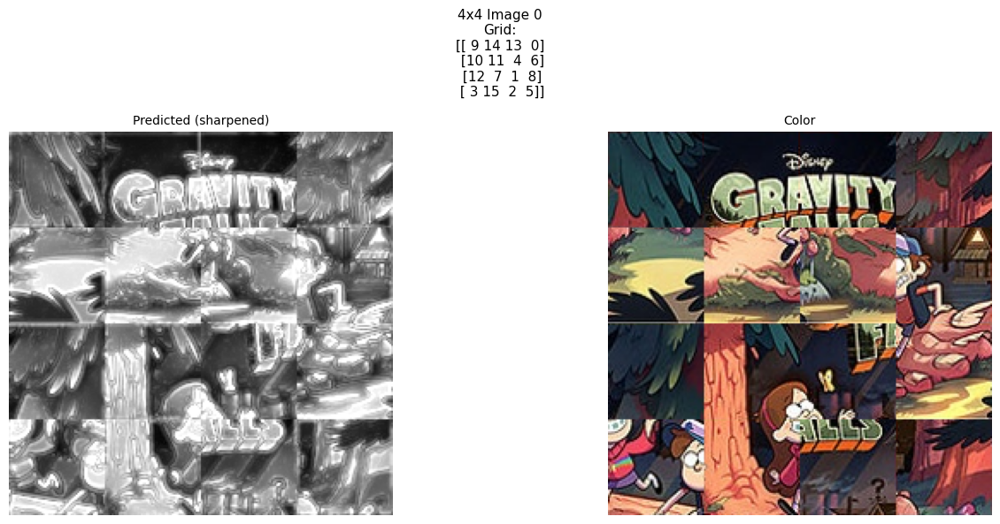


=== Solving 4x4 image 1 ===


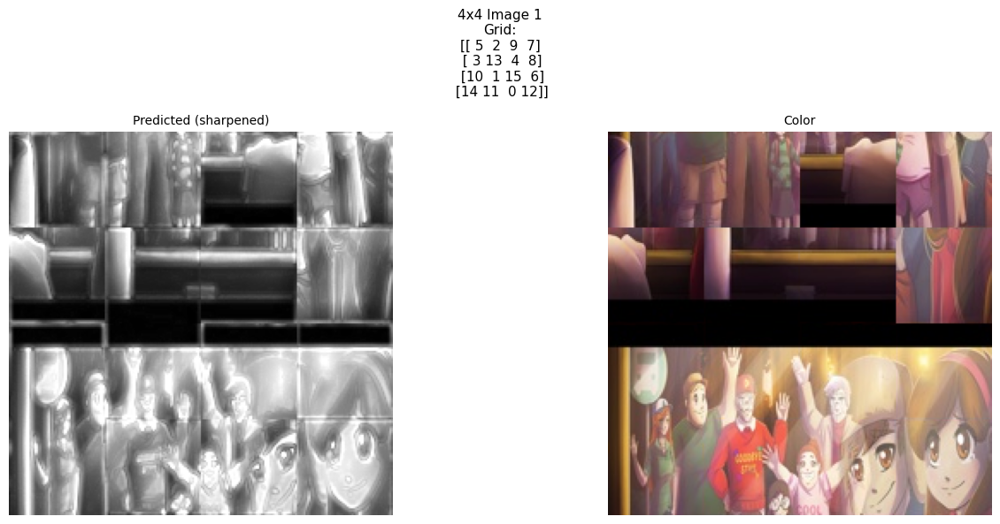


=== Solving 4x4 image 2 ===


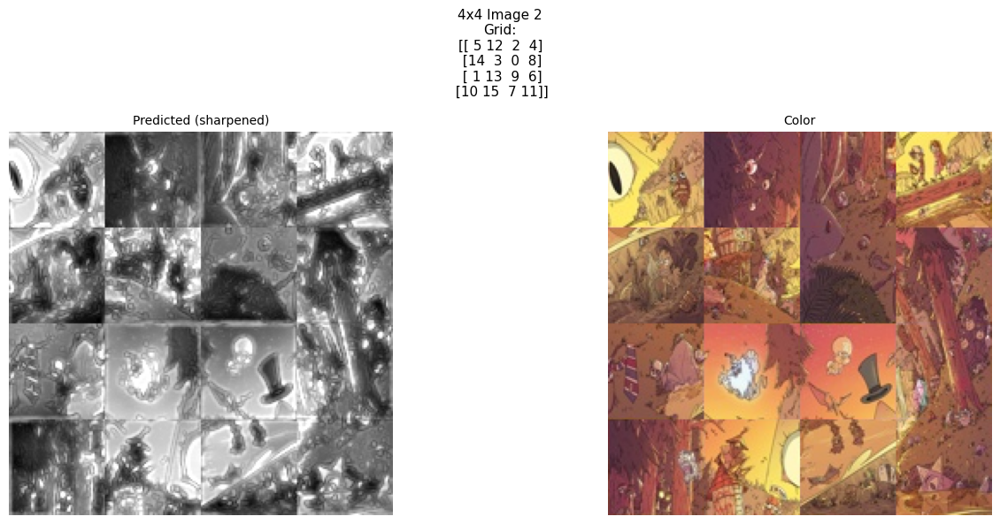


=== Solving 4x4 image 3 ===


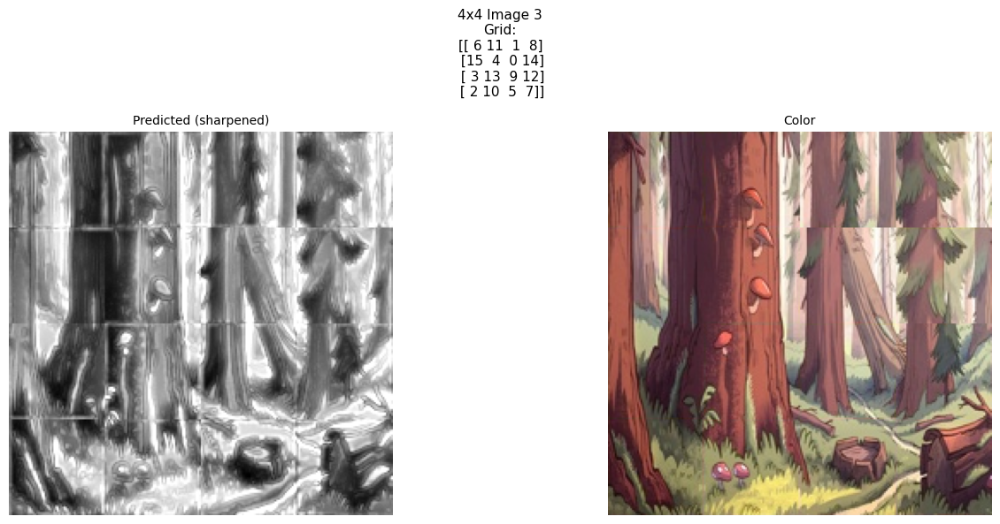


=== Solving 4x4 image 4 ===


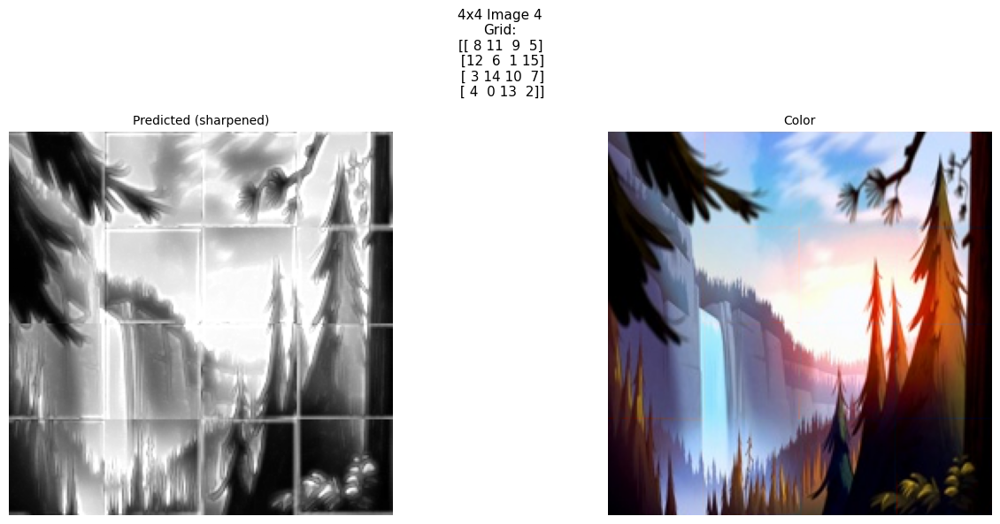


=== Solving 4x4 image 5 ===


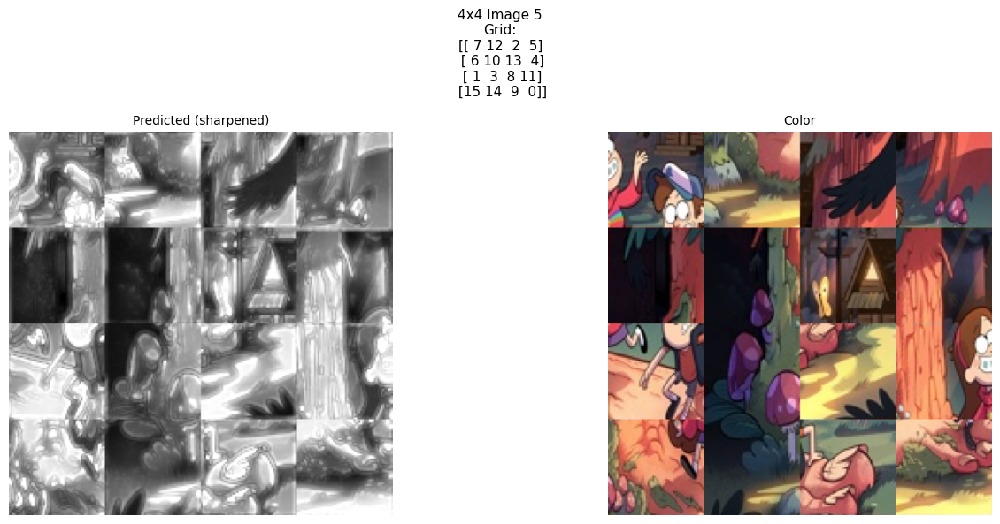


=== Solving 4x4 image 6 ===


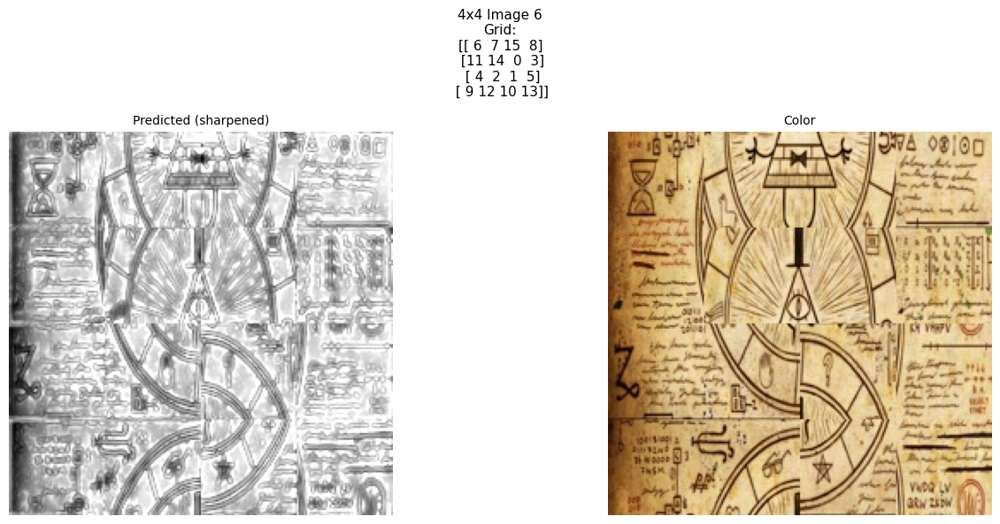


=== Solving 4x4 image 7 ===


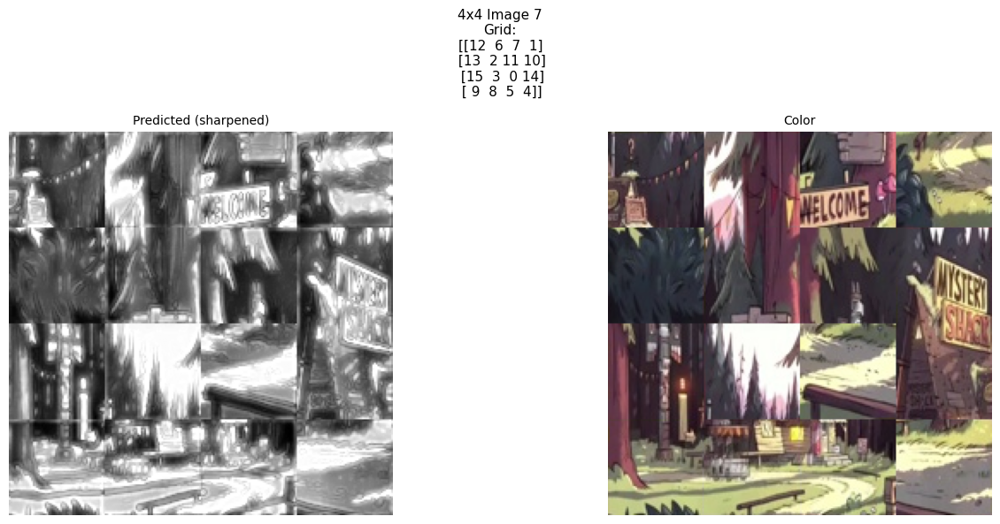


=== Solving 4x4 image 8 ===


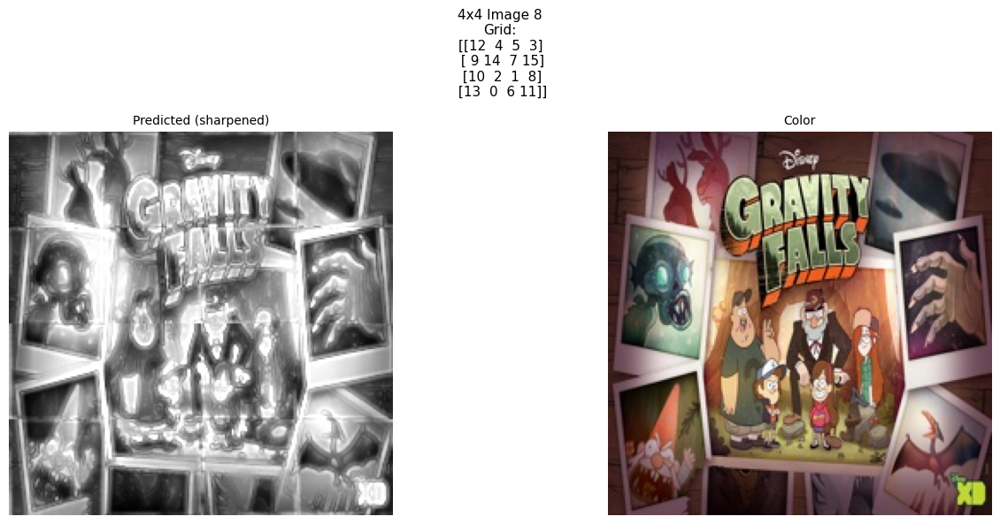


=== Solving 4x4 image 9 ===


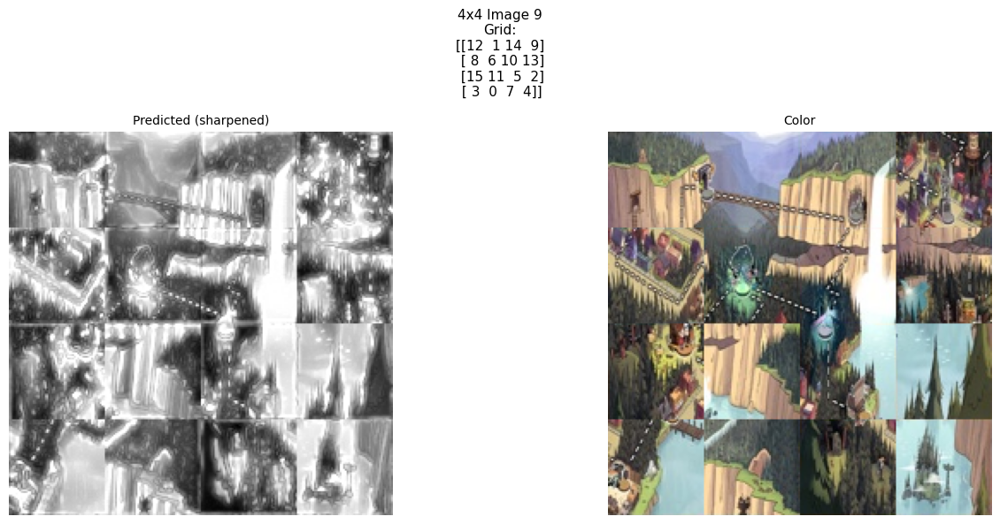

In [60]:
for image_id in range(10):
    print(f"\n=== Solving 4x4 image {image_id} ===")
    solve_and_show_4x4(image_id, versions=("sharpened",), max_shift=6, steps=40000, restarts=6)
